# Gravitational Orbits

We consider the motion of particles/bodies interacting with each other through only their gravitational interations in the form of 

$\begin{align}
   F=\frac{Gm_1m_2}{r^3}\overrightarrow{r}
\end{align}$

By looking at x and y components, we consider the 2 dimensional movement of these particles. We also get a set of relatively simple equations to work with, where the acceleration of each object is simply

$\begin{align}
   a=\frac{Gm_o}{r^3}\overrightarrow{r} \text{   where } m_0 \text{ is the other mass in the relation}
\end{align}$


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

In [2]:
# Change the common font size
font_size = 14
plt.rcParams.update({'font.size': font_size})

In [3]:
class Orbits:
    """
    This class will have the lagrangians for the two bodies in x and y components for easier graphing. Following the Hints
    and Suggestions video, I will use a similar setup
    
    Parameters:
    m_1 : float
        mass of the first object
    m_2 : float
        mass of the second object
    G : float
        G constant
        
    Methods:
    dy_dt (t, y)
        Returns the right side of the differential equation
    """
    
    def __init__(self, m_1 = 1., m_2 = 1., G = 1.):
        self.m_1 = m_1
        self.m_2 = m_2
        self.G = G

    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dy/dt d^2y/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            8-component vector with 
                y[0] = x_1(t), y[1] = x_dot_1(t), 
                y[2] = y_1(t), y[3] = y_dot_1(t),
                y[4] = x_2(t), y[5] = x_dot_2(t), 
                y[6] = y_2(t), y[7] = y_dot_2(t)            
        """
        
        r_12 = np.sqrt( (y[0]-y[4])**2 + (y[2]-y[6])**2)
        return [ \
                y[1], self.G * self.m_2 * (y[4] - y[0]) /r_12**3, \
                y[3], self.G * self.m_2 * (y[6] - y[2]) /r_12**3, \
                y[5], -self.G * self.m_1 * (y[4] - y[0]) /r_12**3, \
                y[7], -self.G * self.m_1 * (y[6] - y[2]) /r_12**3, \
               ]
 
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """

        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
        x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = solution.y
        return x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2
    

#WIP Leapfrog
    
    def solve_ode_Leapfrog(self, t_pts, r_0, r_dot_0, phi_0):
        """
        Solve the ODE given initial conditions with the Leapfrog method.
        """
        delta_t = t_pts[1] - t_pts[0]
        
        # initialize the arrays for r, rdot, r_dot_half, phi with zeros
        num_t_pts = len(t_pts)
        r = np.zeros(num_t_pts)
        r_dot = np.zeros(num_t_pts)
        r_dot_half = np.zeros(num_t_pts)
        phi = np.zeros(num_t_pts)
        
        # initial conditions
        r[0] = r_0
        r_dot[0] = r_dot_0
        phi[0] = phi_0
        
        # step through the differential equation
        for i in np.arange(num_t_pts - 1):
            t = t_pts[i]
            y = [r[i], r_dot[i], phi[i]]
            r_dot_half[i] = r_dot[i] + self.dy_dt(t, y)[1] * delta_t/2.
            r[i+1] = r[i] + r_dot_half[i] * delta_t
            
            y = [r[i+1], r_dot[i], phi[i]]
            r_dot[i+1] = r_dot_half[i] + self.dy_dt(t, y)[1] * delta_t/2.
            
            phi[i+1] = phi[i] + self.dy_dt(t,y)[2] * delta_t
        return r, r_dot, phi   
        
    
    def energy(self, t_pts, r, r_dot):
        """Evaluate the energy as a function of time"""
        return (self.mu/2.) * r_dot**2 + self.Ueff(r)

In [4]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

## 2 Body Orbits

In [5]:
# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
m_1 = 1.
m_2 = 5.

o1 = Orbits(m_1, m_2, G)

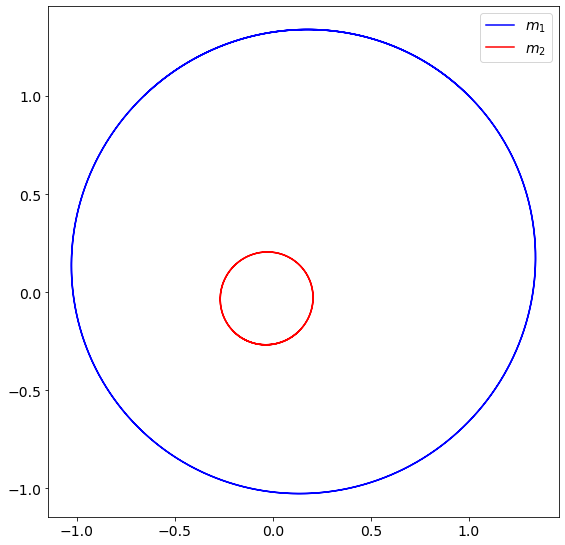

In [6]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 1.
x_dot_1_0 = -1.
y_1_0 = 1.
y_dot_1_0 = 1.

x_2_0 = -(m_1/m_2) * x_1_0
x_dot_2_0 = -(m_1/m_2) * x_dot_1_0
y_2_0 = -(m_1/m_2) * y_1_0
y_dot_2_0 = -(m_1/m_2) * y_dot_1_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o1.solve_ode(t_pts, y_0)

#Plotting
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()



This is pretty much as expected. The lighter mass orbits around the heavier.
Now, lets make m2 much larger.

In [7]:
# Plotting time 
t_start = 0.
t_end = 20.
delta_t = 0.001
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
# Initial conditions
G = 1.
m_1 = 1.
m_2 = 50.

o2 = Orbits(m_1, m_2, G)

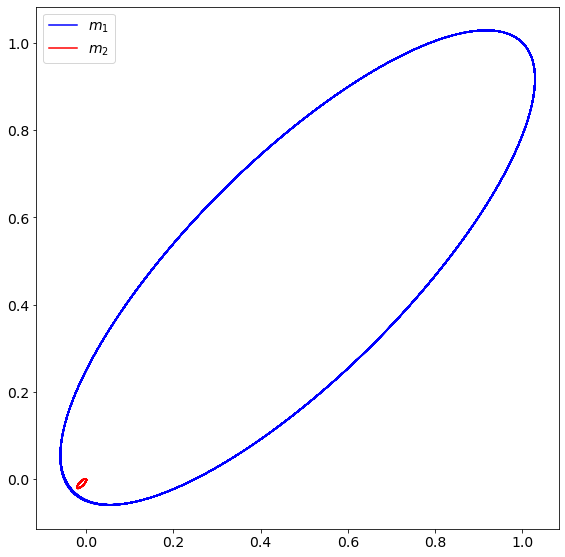

In [8]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 1.
x_dot_1_0 = -1.
y_1_0 = 1.
y_dot_1_0 = 1.

x_2_0 = -(m_1/m_2) * x_1_0
x_dot_2_0 = -(m_1/m_2) * x_dot_1_0
y_2_0 = -(m_1/m_2) * y_1_0
y_dot_2_0 = -(m_1/m_2) * y_dot_1_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o2.solve_ode(t_pts, y_0)

#Plotting
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

This is just an extremely elliptical orbit. However, we start to see that the heavier mass is a lot less than before
Now, let's increase G so we can pull that lighter mass back in

In [9]:
# Plotting time 
t_start = 0.
t_end = 20.
delta_t = 0.001
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  
# Initial conditions
G = 50.
m_1 = 50.
m_2 = 1.

o3 = Orbits(m_1, m_2, G)

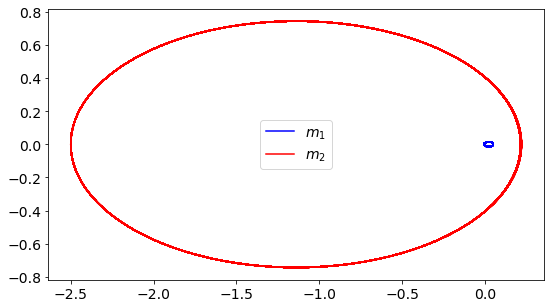

In [10]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 0.05
x_dot_1_0 = 0.
y_1_0 = 0.
y_dot_1_0 = 0.25

x_2_0 = -(m_1/m_2) * x_1_0
x_dot_2_0 = -(m_1/m_2) * x_dot_1_0
y_2_0 = -(m_1/m_2) * y_1_0
y_dot_2_0 = -(m_1/m_2) * y_dot_1_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2 = o3.solve_ode(t_pts, y_0)

#Plotting
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()

## 3 Body Orbits

In [11]:
class TripleOrbits:
    """
    This class will have the lagrangians for the two bodies in x and y components for easier graphing. Following the Hints
    and Suggestions video, I will use a similar setup
    
    Parameters:
    m_1 : float
        mass of the first object
    m_2 : float
        mass of the second object
    m_3 : float
        mass of the third object
    G : float
        G constant
        
    Methods:
    dy_dt (t, y)
        Returns the right side of the differential equation
    """
    
    def __init__(self, m_1 = 1., m_2 = 1., m_3 = 1., G = 1.):
        self.m_1 = m_1
        self.m_2 = m_2
        self.m_3 = m_3
        self.G = G

    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq: 
        [dy/dt d^2y/dt^2]
        
        Parameters
        ----------
        t : float
            time 
        y : float
            12-component vector with 
                y[0] = x_1(t), y[1] = x_dot_1(t), 
                y[2] = y_1(t), y[3] = y_dot_1(t),
                y[4] = x_2(t), y[5] = x_dot_2(t), 
                y[6] = y_2(t), y[7] = y_dot_2(t),
                y[8] = x_3(t), y[9] = x_dot_3(t), 
                y[10] = y_3(t), y[11] = y_dot_3(t),
        """
        
        r_12 = np.sqrt( (y[0]-y[4])**2 + (y[2]-y[6])**2)
        r_13 = np.sqrt( (y[0]-y[8])**2 + (y[2]-y[10])**2)
        r_23 = np.sqrt( (y[4]-y[8])**2 + (y[6]-y[10])**2)
        return [ \
                y[1], self.G * self.m_2 * (y[4] - y[0]) /r_12**3 + self.G * self.m_3 * (y[8] - y[0]) /r_13**3, \
                y[3], self.G * self.m_2 * (y[6] - y[2]) /r_12**3 + self.G * self.m_3 * (y[10] - y[2]) /r_13**3, \
                y[5], -self.G * self.m_1 * (y[4] - y[0]) /r_12**3 + self.G * self.m_3 * (y[8] - y[4]) /r_23**3, \
                y[7], -self.G * self.m_1 * (y[6] - y[2]) /r_12**3 + self.G * self.m_3 * (y[10] - y[6]) /r_23**3, \
                y[9], -self.G * self.m_1 * (y[8] - y[0]) /r_13**3 - self.G * self.m_2 * (y[8] - y[4]) /r_23**3, \
                y[11], -self.G * self.m_1 * (y[10] - y[2]) /r_13**3 - self.G * self.m_2 * (y[10] - y[6]) /r_23**3, \
               ]
 
    def solve_ode(self, t_pts, z_0,
                  abserr=1.0e-8, relerr=1.0e-8):
        """
        Solve the ODE given initial conditions.
        Use solve_ivp with the option of specifying the method.
        Specify smaller abserr and relerr to get more precision.
        """

        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]), 
                             y_0, t_eval=t_pts, method='RK23', 
                             atol=abserr, rtol=relerr)
        x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = solution.y
        return x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3
    

#WIP Leapfrog
    
    def solve_ode_Leapfrog(self, t_pts, r_0, r_dot_0, phi_0):
        """
        Solve the ODE given initial conditions with the Leapfrog method.
        """
        delta_t = t_pts[1] - t_pts[0]
        
        # initialize the arrays for r, rdot, r_dot_half, phi with zeros
        num_t_pts = len(t_pts)
        r = np.zeros(num_t_pts)
        r_dot = np.zeros(num_t_pts)
        r_dot_half = np.zeros(num_t_pts)
        phi = np.zeros(num_t_pts)
        
        # initial conditions
        r[0] = r_0
        r_dot[0] = r_dot_0
        phi[0] = phi_0
        
        # step through the differential equation
        for i in np.arange(num_t_pts - 1):
            t = t_pts[i]
            y = [r[i], r_dot[i], phi[i]]
            r_dot_half[i] = r_dot[i] + self.dy_dt(t, y)[1] * delta_t/2.
            r[i+1] = r[i] + r_dot_half[i] * delta_t
            
            y = [r[i+1], r_dot[i], phi[i]]
            r_dot[i+1] = r_dot_half[i] + self.dy_dt(t, y)[1] * delta_t/2.
            
            phi[i+1] = phi[i] + self.dy_dt(t,y)[2] * delta_t
        return r, r_dot, phi   
        
    
    def energy(self, t_pts, r, r_dot):
        """Evaluate the energy as a function of time"""
        return (self.mu/2.) * r_dot**2 + self.Ueff(r)

In [12]:
# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
m_1 = 1.
m_2 = 1.
m_3 = 10.
to1 = TripleOrbits(m_1, m_2, m_3, G)

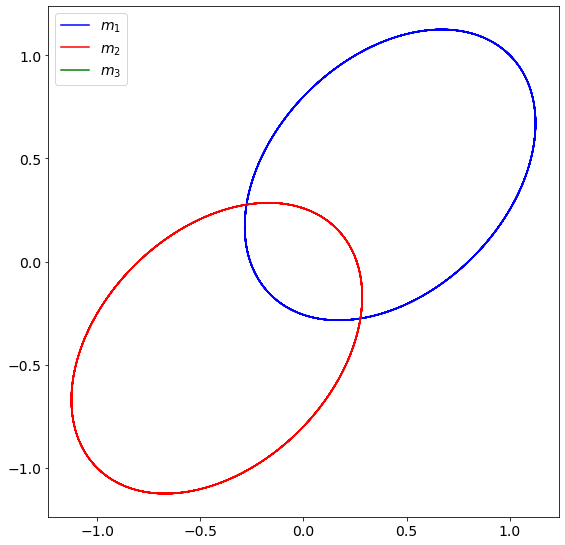

In [13]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 1.
x_dot_1_0 = -1.
y_1_0 = 1.
y_dot_1_0 = 1.

x_2_0 = -1.
x_dot_2_0 = 1.
y_2_0 = -1.
y_dot_2_0 = -1.

x_3_0 = -(m_1/m_3) * x_1_0 - (m_2/m_3) * x_2_0
x_dot_3_0 = -(m_1/m_3) * x_dot_1_0 - (m_2/m_3) * x_dot_2_0
y_3_0 = -(m_1/m_3) * y_1_0 - (m_2/m_3) * y_2_0
y_dot_3_0 = -(m_1/m_3) * y_dot_1_0 - (m_2/m_3) * y_dot_2_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0, x_3_0, x_dot_3_0, y_3_0, y_dot_3_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = to1.solve_ode(t_pts, y_0)

#Plotting
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.plot(x_3, y_3, color='green', label=r'$m_3$')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()



This is an obviously clean and stable orbit that came to mind first when trying to think of initial conditions. m3 stays stationary at (0,0) while m1 and m2 go around as shown. Increasing m_3 increases how elliptical the orbits are. 
Outside of this, it's actually kinda hard to find stable orbits of this 3 body system. For example

In [14]:
# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
m_1 = 1.
m_2 = 1.
m_3 = 10.
to1 = TripleOrbits(m_1, m_2, m_3, G)

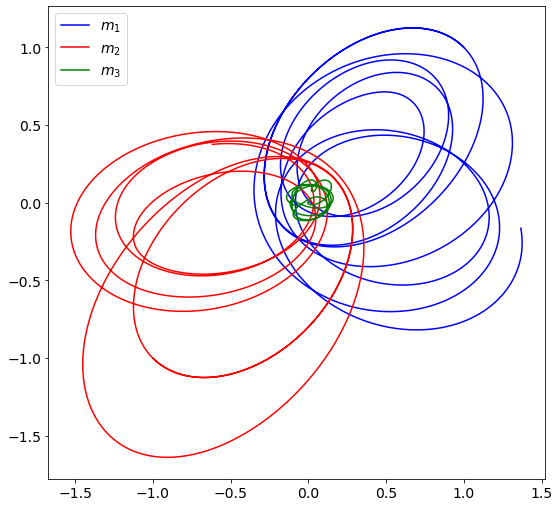

In [15]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 1. - 0.00001
x_dot_1_0 = -1.
y_1_0 = 1.
y_dot_1_0 = 1.

x_2_0 = -1.
x_dot_2_0 = 1.
y_2_0 = -1.
y_dot_2_0 = -1.

x_3_0 = -(m_1/m_3) * x_1_0 - (m_2/m_3) * x_2_0
x_dot_3_0 = -(m_1/m_3) * x_dot_1_0 - (m_2/m_3) * x_dot_2_0
y_3_0 = -(m_1/m_3) * y_1_0 - (m_2/m_3) * y_2_0
y_dot_3_0 = -(m_1/m_3) * y_dot_1_0 - (m_2/m_3) * y_dot_2_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0, x_3_0, x_dot_3_0, y_3_0, y_dot_3_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = to1.solve_ode(t_pts, y_0)

#Plotting
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(1,1,1)

start, stop = start_stop_indices(t_pts, t_start, t_end)
ax.plot(x_1, y_1, color='blue', label=r'$m_1$')
ax.plot(x_2, y_2, color='red', label=r'$m_2$')
ax.plot(x_3, y_3, color='green', label=r'$m_3$')
ax.legend()
ax.set_aspect(1)

fig.tight_layout()



Yeah... not pretty. If anything, this shows the chaotic nature of the 3 body system. I only changed 1 parameter by a very small amount. 
Let's animate the pretty one. Animating the more complicated ones seem make the animations too large.

In [22]:
from matplotlib import animation, rc
from IPython.display import HTML

In [23]:
# Plotting time 
t_start = 0.
t_end = 10.
delta_t = 0.001

t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Initial conditions
G = 1.
m_1 = 1.
m_2 = 1.
m_3 = 10.
to1 = TripleOrbits(m_1, m_2, m_3, G)

In [24]:
#Create initial conditions such that the CM has 0 velocity
x_1_0 = 1.
x_dot_1_0 = -1.
y_1_0 = 1.
y_dot_1_0 = 1.

x_2_0 = -1.
x_dot_2_0 = 1.
y_2_0 = -1.
y_dot_2_0 = -1.

x_3_0 = -(m_1/m_3) * x_1_0 - (m_2/m_3) * x_2_0
x_dot_3_0 = -(m_1/m_3) * x_dot_1_0 - (m_2/m_3) * x_dot_2_0
y_3_0 = -(m_1/m_3) * y_1_0 - (m_2/m_3) * y_2_0
y_dot_3_0 = -(m_1/m_3) * y_dot_1_0 - (m_2/m_3) * y_dot_2_0

y_0 = [x_1_0, x_dot_1_0, y_1_0, y_dot_1_0, x_2_0, x_dot_2_0, y_2_0, y_dot_2_0, x_3_0, x_dot_3_0, y_3_0, y_dot_3_0]
x_1, x_dot_1, y_1, y_dot_1, x_2, x_dot_2, y_2, y_dot_2, x_3, x_dot_3, y_3, y_dot_3 = to1.solve_ode(t_pts, y_0)


In [25]:
%%capture

x_min = -2.
x_max = 2.
y_min = -2.
y_max = 2.

fig_anim = plt.figure(figsize=(10,6), num='Triple Body')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

ln1_anim, = ax_anim.plot(x_1, y_1, color = 'blue', lw=1)
ln2_anim, = ax_anim.plot(x_2, y_2, color = 'red', lw=1)
ln3_anim, = ax_anim.plot(x_3, y_3, color = 'green', lw=1)

pt1_anim, = ax_anim.plot(x_1[0], y_1[0], 'o', markersize = 8, color = 'blue')
pt2_anim, = ax_anim.plot(x_2[0], y_2[0], 'o', markersize = 8, color = 'blue')
pt3_anim, = ax_anim.plot(x_3[0], y_3[0], 'o', markersize = 8, color = 'blue')

ax_anim.set_aspect(1)
ax_anim.axis('off')
fig_anim.tight_layout()

In [26]:
def animate_orbits(i):
    
    i_skip = 5*i
    
    pt1_anim.set_data(x_1[i_skip], y_1[i_skip])
    pt2_anim.set_data(x_2[i_skip], y_2[i_skip])
    pt3_anim.set_data(x_3[i_skip], y_3[i_skip])
    
    return (pt1_anim, pt2_anim, pt3_anim)

In [27]:
frame_interval= 10.
frame_number = 1000
anim = animation.FuncAnimation(fig_anim,
                              animate_orbits,
                              init_func=None,
                              frames=frame_number,
                              interval=frame_interval,
                              blit=True,
                              repeat=False)

In [28]:
HTML(anim.to_jshtml())

In [ ]:
.